In [1]:
import pandas as pd
import numpy as np
import h5py
import datetime
import matplotlib.pyplot as plt
from matplotlib import colors as col
from matplotlib.dates import DateFormatter
import seaborn as sns
from scipy.signal import savgol_filter
plt.style.use('seaborn')

In [43]:
def get_calibration_temperature(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal_temp = h5_file[calibration_path].attrs['ftir_temperature']
        return cal_temp
    
def get_insertion_temperature(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_temp = h5_file[insertion_path].attrs['ftir_temp']
        return ins_temp
    
def get_visible_white_calibration_curve(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal = h5_file[calibration_path].attrs['white_spectrum'][:]
        return cal
    
def get_ftir_white_calibration_curve(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal = h5_file[calibration_path].attrs['white_spectrum2'][:]
        return cal
    
def get_visible_wavelength_vector(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        waves = h5_file[calibration_path].attrs['spec1_wavelengths_vector'][:]
        return waves
    
def get_ftir_wavelength_vector(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        waves = h5_file[calibration_path].attrs['spec2_wavelengths_vector'][:]
        return waves
    
def get_ftir_insertion_absorbances(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_abs = h5_file[f'{insertion_path}/spectrometer2/derived/absorbances'][:]
        return ins_abs
    
def get_ftir_insertion_raw_spectra(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_raw = h5_file[f'{insertion_path}/spectrometer2/spectra'][:]
        return ins_raw
    
def get_visible_insertion_absorbances(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_abs = h5_file[f'{insertion_path}/spectrometer1/derived/absorbances'][:]
        return ins_abs
    
def get_visible_insertion_raw_spectra(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_raw = h5_file[f'{insertion_path}/spectrometer1/spectra'][:]
        return ins_raw
    
def create_list_of_items_in_node(item_type, file, node):
    with h5py.File(file, 'r') as h5_file:
        keys = []
        if item_type == "group":
            my_type = h5py._hl.group.Group
        if item_type == "dataset":
            my_type = h5py._hl.dataset.Dataset
        h5_file[node].visit(lambda key: keys.append(key) if type(h5_file[node][key]) is my_type else None)
        return keys

def create_list_of_calibrations_in_node(file, node):
    calibrations = []
    all_groups = create_list_of_items_in_node("group", file, node)
    for group in all_groups:
        if group[-6:-3] == 'cal':
            calibrations.append(node + '/' + group)
    return calibrations

def create_list_of_insertions_in_calibration(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        insertion_keys = list(h5_file[calibration_path].keys())
        insertions = [f'{calibration_path}/{key}' for key in insertion_keys]            
        return insertions
    
def select_by_depth_range(df, range_start, range_end):
    df_out = df.loc[(df['depth'] > range_start) & (df['depth'] < range_end)]
    return df_out

def calculate_absorbance_from_raw(raw_spectrum, white_spectrum, dark_spectrum):
    reflectance = ((raw_spectrum - dark_spectrum) / (white_spectrum - dark_spectrum))
    inverse_reflectance = 1/reflectance
    absorbance = np.log10(inverse_reflectance.astype(np.float64))
    return absorbance

def calculate_absorbance_for_2D_array(array, white_spectrum, dark_spectrum):
    absorbance_array = np.empty_like(array, dtype=np.float64)
    for i in range(array.shape[0]):
        absorbance_spectrum = calculate_absorbance_from_raw(array[i, :], white_spectrum, dark_spectrum)
        absorbance_array[i, :] = absorbance_spectrum
    return absorbance_array
        

In [3]:
def construct_full_file_path(data_path, file_name):
    file_path = data_path + file_name
    return file_path

def create_list_of_sessions_in_file(file_name):
    sessions = []
    all_groups = create_list_of_items_in_node("group", file_name, "/")
    for group in all_groups:
        if (group[0:3] == 'ses') and (len(group) == 10):
            sessions.append(group)
    return sessions

def create_list_of_insertions_in_file(file_name):
    insertions = []
    sessions = create_list_of_sessions_in_file(file_name)
    for session in sessions:
        calibrations = create_list_of_calibrations_in_node(file_name, session)
        for calibration in calibrations:
            cal_insertions = create_list_of_insertions_in_calibration(file_name, calibration)
            for insertion in cal_insertions:
                insertions.append(insertion)
    return insertions
            
def get_insertion_timestamp(file, insertion_path):
    with h5py.File(file, 'r') as h5_file:
        ins_time = h5_file[insertion_path].attrs['start_time']
        ins_timestamp = pd.Timestamp(ins_time, unit='us')
        return ins_timestamp
    
def get_calibration_timestamp(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal_time = h5_file[calibration_path].attrs['calibration_start_time']
        cal_timestamp = pd.Timestamp(cal_time, unit='us')
        return cal_timestamp  
    
def find_position_in_wavelength_vector(wavelength_vector, integer):
    position = np.where(np.isclose(wavelength_vector, integer, 1e-3))[0][0]
    return position

def normalize(value, max_value, min_value):
    normalized_value = (value - min_value)/(max_value - min_value)
    return normalized_value

def get_ftir_dark_calibration_curve(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal = h5_file[calibration_path].attrs['dark_spectrum2'][:]
        return cal
    
def get_visible_dark_calibration_curve(file, calibration_path):
    with h5py.File(file, 'r') as h5_file:
        cal = h5_file[calibration_path].attrs['dark_spectrum'][:]
        return cal
        
def get_ftir_spectrum_timestamp(file, insertion_path, index):
    with h5py.File(file, 'r') as h5_file:
        time = h5_file[f'{insertion_path}/spectrometer2/timestamps'][index]
        timestamp = pd.Timestamp(time, unit='us')
        return timestamp
    
def get_visible_spectrum_timestamp(file, insertion_path, index):
    with h5py.File(file, 'r') as h5_file:
        time = h5_file[f'{insertion_path}/spectrometer1/timestamps'][index]
        timestamp = pd.Timestamp(time, unit='us')
        return timestamp

In [4]:
df = pd.read_csv('data/white_insertions.csv')
today_df = df.loc[df['date'] == '4/26/21'].copy()
afternoon_df = today_df.loc[today_df['session'] == 'session002'].copy()

In [5]:
afternoon_df

,file_name,date,session,calibration,insertion,conditions
123,210426_green_tests/green_testing_210426.h5,4/26/21,session002,cal001,ins001,sunshine box
124,210426_green_tests/green_testing_210426.h5,4/26/21,session002,cal001,ins002,sunshine box
125,210426_green_tests/green_testing_210426.h5,4/26/21,session002,cal001,ins003,sunshine box
126,210426_green_tests/green_testing_210426.h5,4/26/21,session002,cal001,ins004,sunshine box
127,210426_green_tests/green_testing_210426.h5,4/26/21,session002,cal001,ins005,sunshine box
128,210426_green_tests/green_testing_210426.h5,4/26/21,session002,cal001,ins006,sunshine box
129,210426_green_tests/green_testing_210426.h5,4/26/21,session002,cal001,ins007,sunshine box
130,210426_green_tests/green_testing_210426.h5,4/26/21,session002,cal001,ins008,sunshine box
131,210426_green_tests/green_testing_210426.h5,4/26/21,session002,cal001,ins009,sunshine box
132,210426_green_tests/green_testing_210426.h5,4/26/21,session002,cal001,ins010,sunshine box


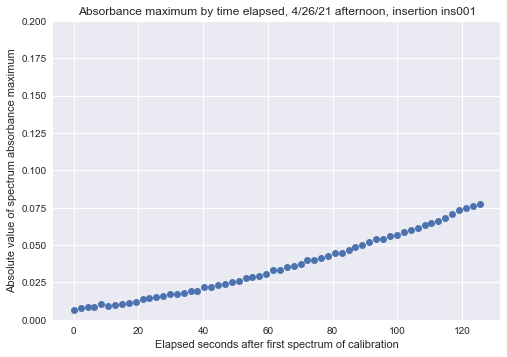

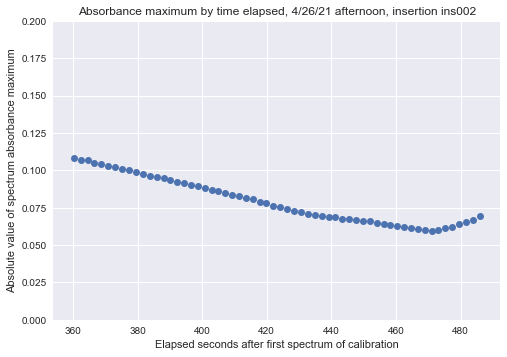

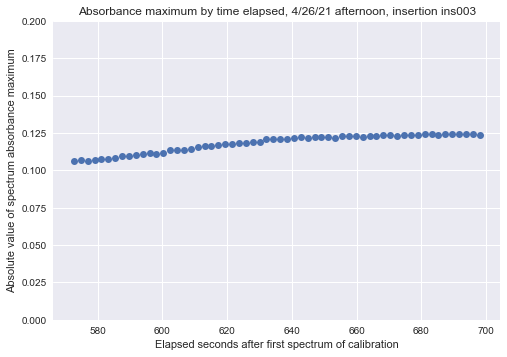

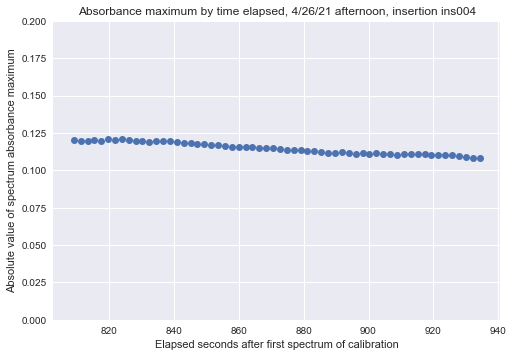

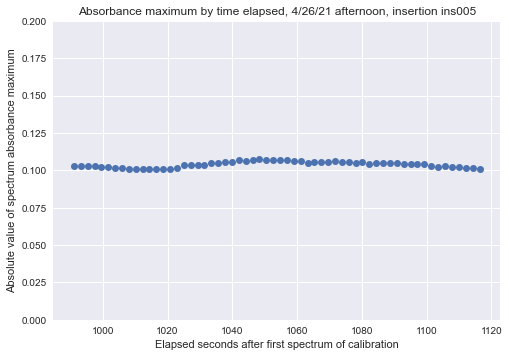

...

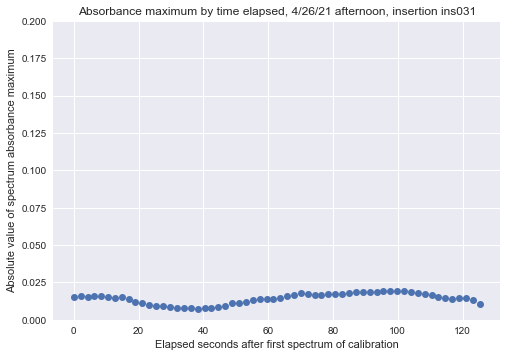

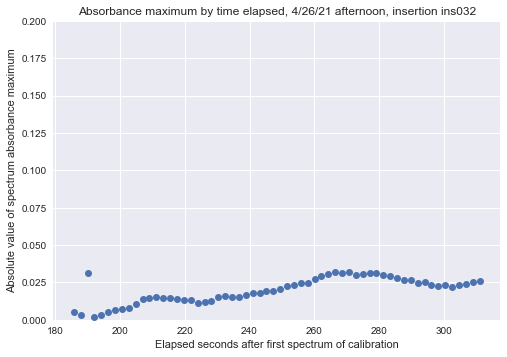

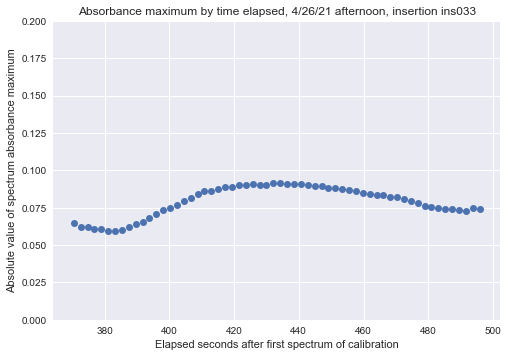

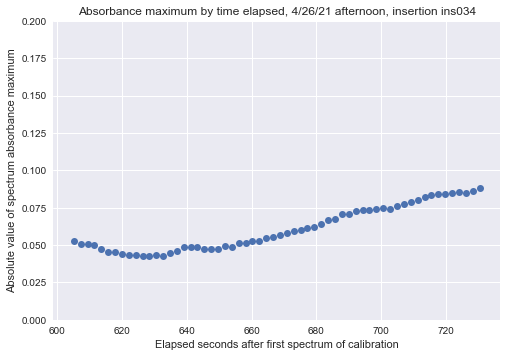

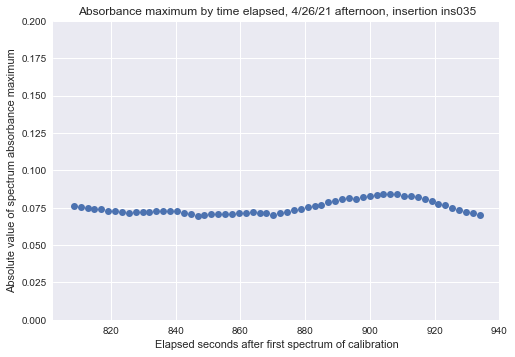

In [13]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
for calibration in afternoon_df['calibration'].unique():
    small_df = afternoon_df.loc[afternoon_df['calibration'] == calibration].copy()
    file = construct_full_file_path(path_name, small_df['file_name'][small_df.index[0]])
    calibration_path = small_df['session'][small_df.index[0]] + '/' + small_df['calibration'][small_df.index[0]]
    calibration_insertions = create_list_of_insertions_in_calibration(file, calibration_path)
    
    first_timestamp = get_ftir_spectrum_timestamp(file, calibration_insertions[0], 0)
    for index in small_df.index:  
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        ftir_waves = get_ftir_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(ftir_waves, 1200)
        end_index = find_position_in_wavelength_vector(ftir_waves, 2200)
        ftir_raw_spectra = get_ftir_insertion_raw_spectra(file, insertion_path)
        ftir_white_spectrum = get_ftir_white_calibration_curve(file, calibration_path)[start_index:end_index]
        ftir_dark_spectrum = get_ftir_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        
        insertion_df = pd.DataFrame()
        for i in range(ftir_raw_spectra.shape[0]):
            absorbance_spectrum = calculate_absorbance_from_raw(ftir_raw_spectra[i, start_index:end_index], ftir_white_spectrum, ftir_dark_spectrum)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            
        ax.plot(insertion_df["time_delta"], insertion_df["max_absorbance"], 'o')
        ax.set_title(f'Absorbance maximum by time elapsed, 4/26/21 afternoon, insertion {insertion}')
        ax.set_ylabel('Absolute value of spectrum absorbance maximum')
        ax.set_xlabel('Elapsed seconds after first spectrum of calibration')
        
        ax.set_ylim(0, 0.2)
        plt.show()
        plt.close()

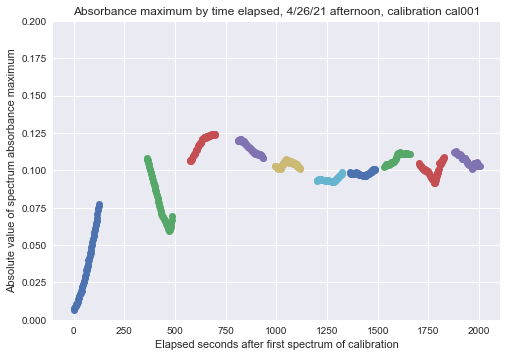

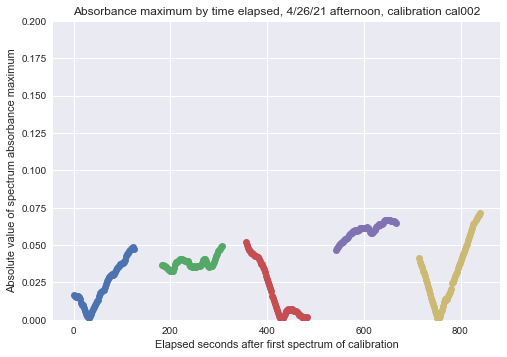

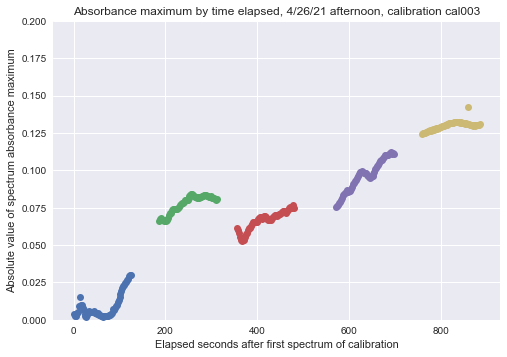

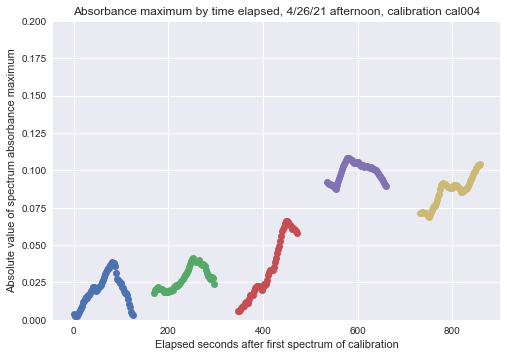

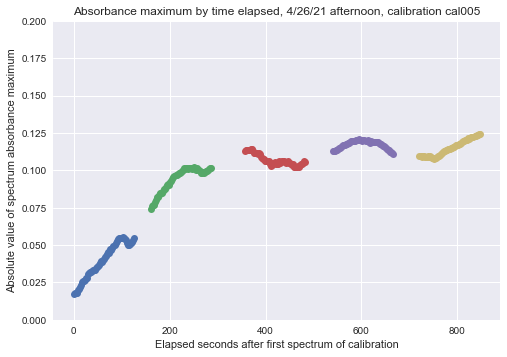

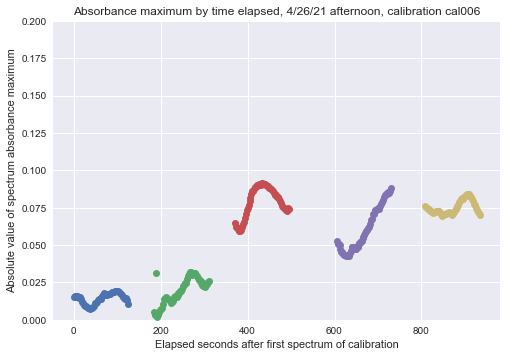

In [16]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
for calibration in afternoon_df['calibration'].unique():
    fig, ax = plt.subplots()
    small_df = afternoon_df.loc[afternoon_df['calibration'] == calibration].copy()
    file = construct_full_file_path(path_name, small_df['file_name'][small_df.index[0]])
    calibration_path = small_df['session'][small_df.index[0]] + '/' + small_df['calibration'][small_df.index[0]]
    calibration_insertions = create_list_of_insertions_in_calibration(file, calibration_path)
    
    first_timestamp = get_ftir_spectrum_timestamp(file, calibration_insertions[0], 0)
    for index in small_df.index:  
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        ftir_waves = get_ftir_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(ftir_waves, 1200)
        end_index = find_position_in_wavelength_vector(ftir_waves, 2200)
        ftir_raw_spectra = get_ftir_insertion_raw_spectra(file, insertion_path)
        ftir_white_spectrum = get_ftir_white_calibration_curve(file, calibration_path)[start_index:end_index]
        ftir_dark_spectrum = get_ftir_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        
        
        insertion_df = pd.DataFrame()
        for i in range(ftir_raw_spectra.shape[0]):
            absorbance_spectrum = calculate_absorbance_from_raw(ftir_raw_spectra[i, start_index:end_index], ftir_white_spectrum, ftir_dark_spectrum)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            
        ax.plot(insertion_df["time_delta"], insertion_df["max_absorbance"], 'o')
    ax.set_title(f'Absorbance maximum by time elapsed, 4/26/21 afternoon, calibration {calibration}')
    ax.set_ylabel('Absolute value of spectrum absorbance maximum')
    ax.set_xlabel('Elapsed seconds after first spectrum of calibration')

    ax.set_ylim(0, 0.2)
    plt.show()
    plt.close()

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

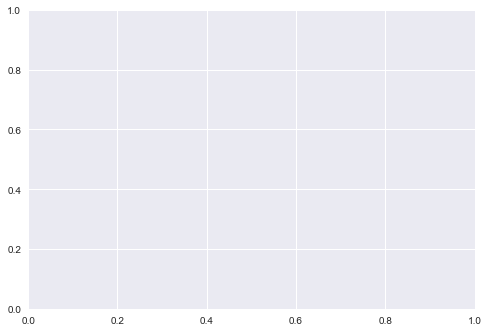

In [54]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
for calibration in afternoon_df['calibration'].unique():
    fig, ax = plt.subplots()
    small_df = afternoon_df.loc[afternoon_df['calibration'] == calibration].copy()
    file = construct_full_file_path(path_name, small_df['file_name'][small_df.index[0]])
    calibration_path = small_df['session'][small_df.index[0]] + '/' + small_df['calibration'][small_df.index[0]]
    calibration_insertions = create_list_of_insertions_in_calibration(file, calibration_path)
    
    first_timestamp = get_ftir_spectrum_timestamp(file, calibration_insertions[0], 0)
    for index in small_df.index:  
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        ftir_waves = get_ftir_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(ftir_waves, 1200)
        end_index = find_position_in_wavelength_vector(ftir_waves, 2200)
        ftir_raw_spectra = get_ftir_insertion_raw_spectra(file, insertion_path)
        ftir_white_spectrum = get_ftir_white_calibration_curve(file, calibration_path)[start_index:end_index]
        ftir_dark_spectrum = get_ftir_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        ftir_absorbance_spectra = calculate_absorbance_for_2D_array(ftir_raw_spectra[:, start_index:end_index], ftir_white_spectrum, ftir_dark_spectrum)
        absorbance_range = np.ptp(ftir_absorbance_spectra, axis=0)
        insertion_df = pd.DataFrame()
        for i in range(ftir_raw_spectra.shape[0]):
            absorbance_spectrum = calculate_absorbance_from_raw(ftir_raw_spectra[i, start_index:end_index], ftir_white_spectrum, ftir_dark_spectrum)
            min_absorbance = absorbance_spectrum.min()
            max_absorbance = absorbance_spectrum.max()
            range_absorbance = absorbance_range[i, :]
            spectrum_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            insertion_df.loc[i, "range_absorbance"] = range_absorbance
            
            
        ax.plot(insertion_df["time_delta"], insertion_df["range_absorbance"], 'o')
    ax.set_title(f'Absorbance maximum by time elapsed, 4/26/21 afternoon, calibration {calibration}')
    ax.set_ylabel('Absolute value of spectrum absorbance maximum')
    ax.set_xlabel('Elapsed seconds after first spectrum of calibration')

    ax.set_ylim(0, 0.2)
    plt.show()
    plt.close()

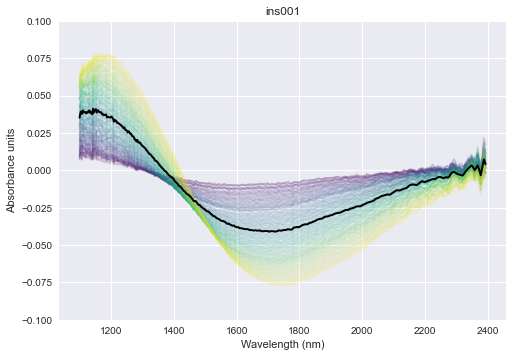

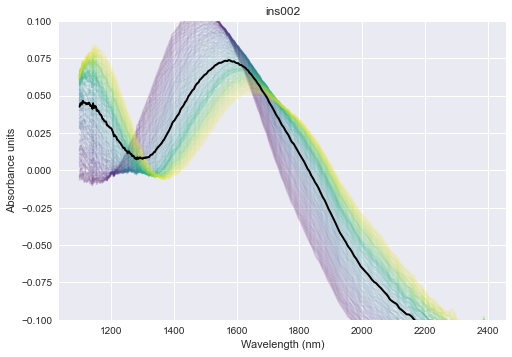

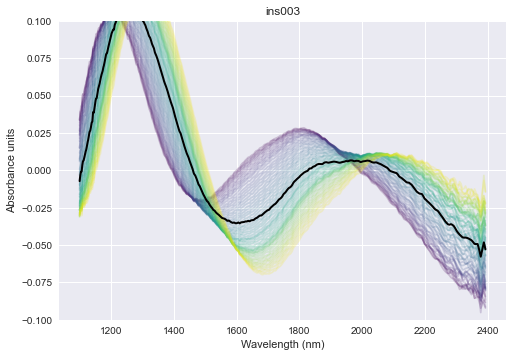

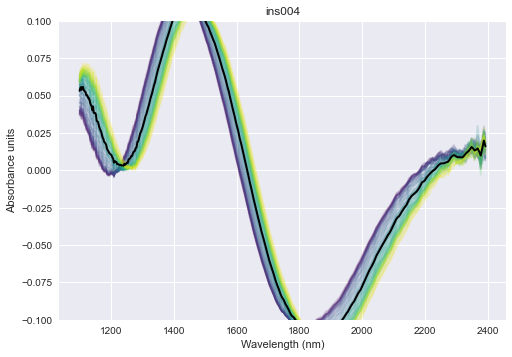

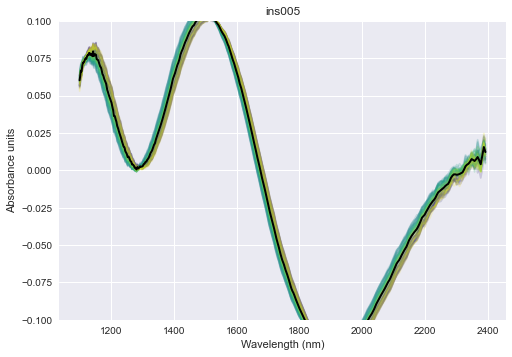

...

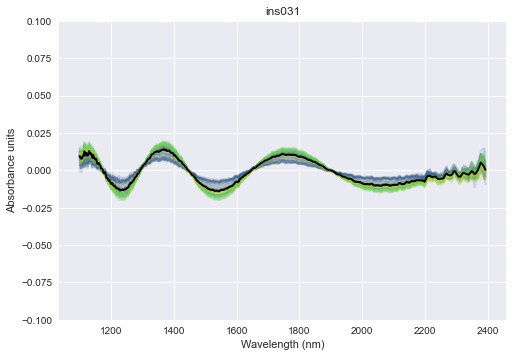

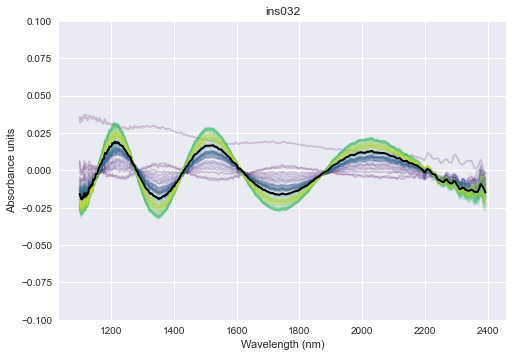

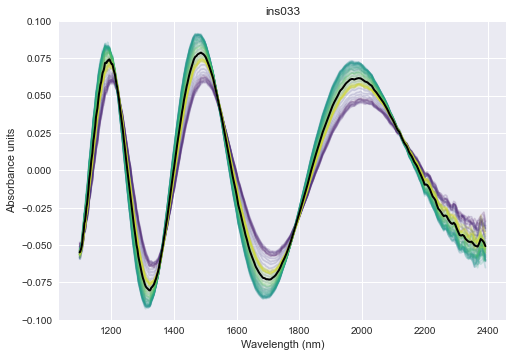

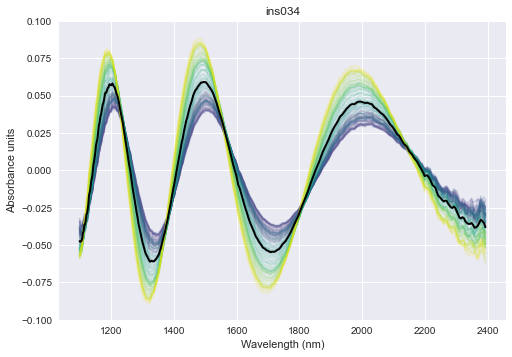

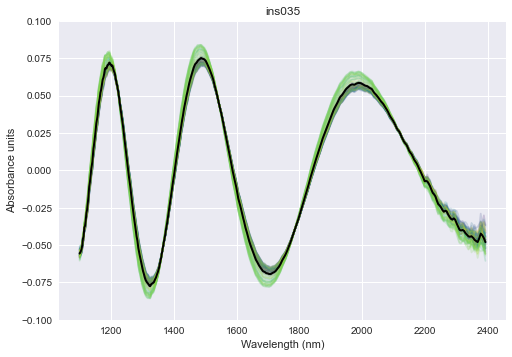

In [18]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
for calibration in afternoon_df['calibration'].unique():
    small_df = afternoon_df.loc[afternoon_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        ftir_waves = get_ftir_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(ftir_waves, 1100)
        end_index = find_position_in_wavelength_vector(ftir_waves, 2400)
        ftir_raw_spectra = get_ftir_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(ftir_raw_spectra[:, start_index:end_index], dtype=np.double)
        ftir_white_spectrum = get_ftir_white_calibration_curve(file, calibration_path)[start_index:end_index]
        ftir_dark_spectrum = get_ftir_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(ftir_raw_spectra.shape[0]):
            absorbance_spectrum = calculate_absorbance_from_raw(ftir_raw_spectra[i, start_index:end_index], ftir_white_spectrum, ftir_dark_spectrum)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            color = plt.cm.viridis(normalize(i, ftir_raw_spectra.shape[0], 0))
            absorbance_spectra[i, :] = absorbance_spectrum
            
            ax.plot(ftir_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(ftir_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(insertion)
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()

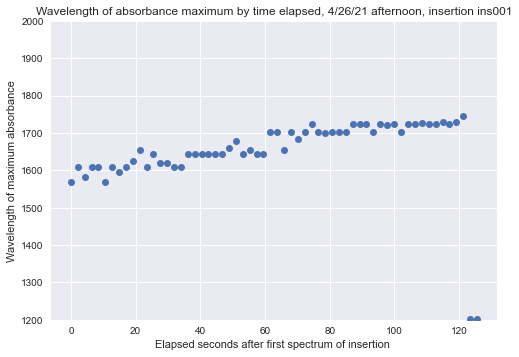

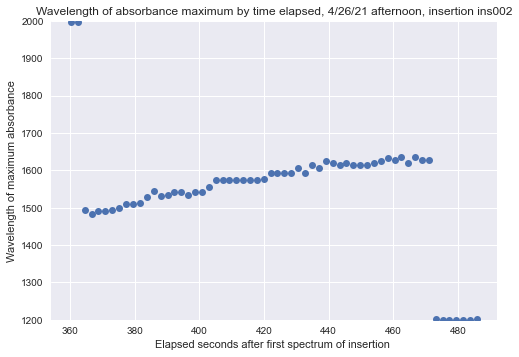

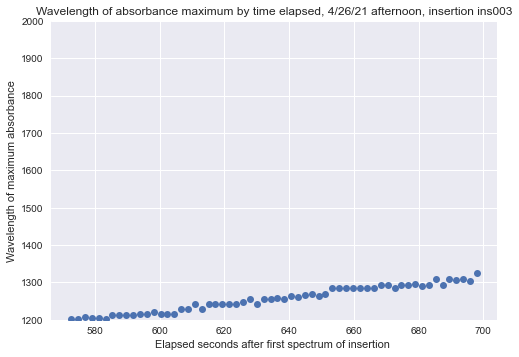

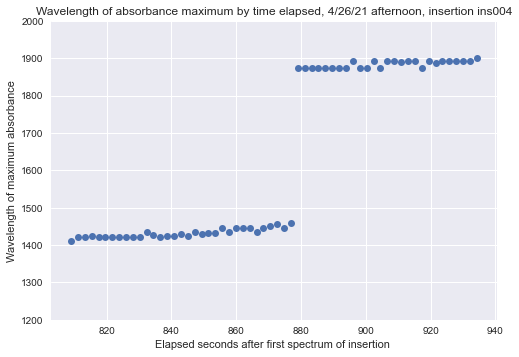

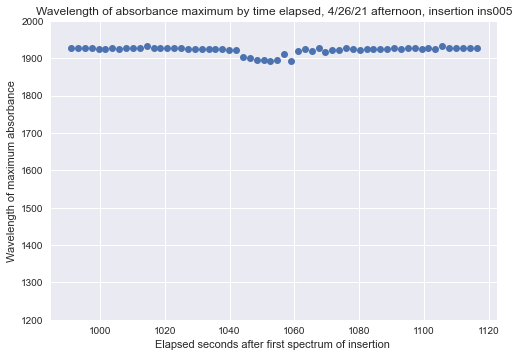

...

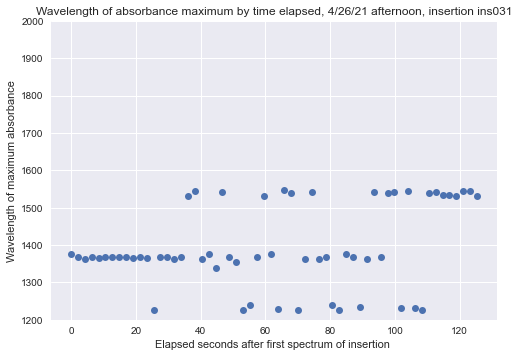

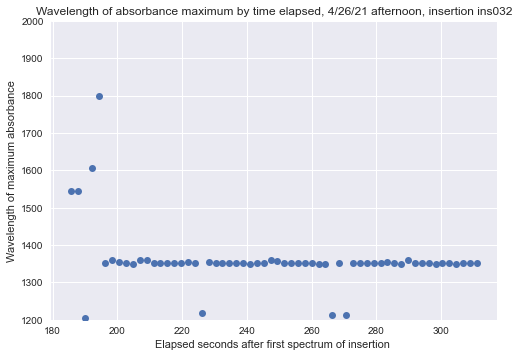

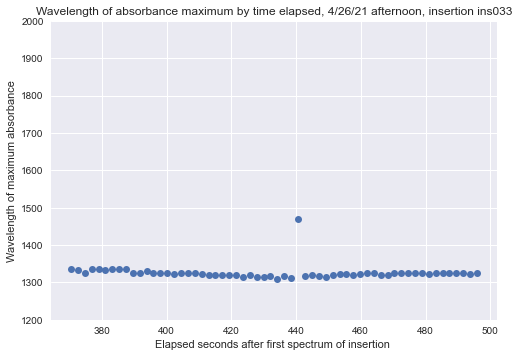

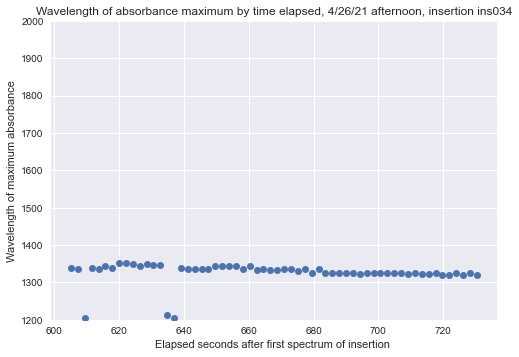

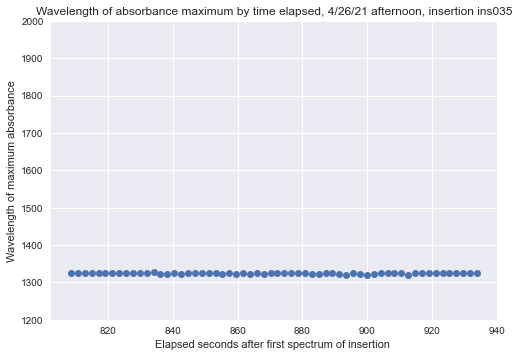

In [22]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
for calibration in afternoon_df['calibration'].unique():
    small_df = afternoon_df.loc[afternoon_df['calibration'] == calibration].copy()
    file = construct_full_file_path(path_name, small_df['file_name'][small_df.index[0]])
    calibration_path = small_df['session'][small_df.index[0]] + '/' + small_df['calibration'][small_df.index[0]]
    calibration_insertions = create_list_of_insertions_in_calibration(file, calibration_path)
    
    first_timestamp = get_ftir_spectrum_timestamp(file, calibration_insertions[0], 0)
    for index in small_df.index: 
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        ftir_waves = get_ftir_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(ftir_waves, 1200)
        end_index = find_position_in_wavelength_vector(ftir_waves, 2000)
        ftir_raw_spectra = get_ftir_insertion_raw_spectra(file, insertion_path)
        ftir_white_spectrum = get_ftir_white_calibration_curve(file, calibration_path)[start_index:end_index]
        ftir_dark_spectrum = get_ftir_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()        
        insertion_df = pd.DataFrame()
        for i in range(ftir_raw_spectra.shape[0]):
            absorbance_spectrum = calculate_absorbance_from_raw(ftir_raw_spectra[i, start_index:end_index], ftir_white_spectrum, ftir_dark_spectrum)
            max_absorbance = abs(absorbance_spectrum).max()
            try:
                max_absorbance_position = np.where(np.isclose(abs(absorbance_spectrum), max_absorbance))[0][0]
            except:
                max_absorbance_position = np.where(np.isclose(absorbance_spectrum, -max_absorbance))[0][0]
            wavelength_max = ftir_waves[start_index:end_index][max_absorbance_position]            
            spectrum_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            insertion_df.loc[i, "wavelength_max"] = wavelength_max
            
        ax.plot(insertion_df["time_delta"], insertion_df["wavelength_max"], 'o')
        ax.set_title(f'Wavelength of absorbance maximum by time elapsed, 4/26/21 afternoon, insertion {insertion}')
        ax.set_ylabel('Wavelength of maximum absorbance')
        ax.set_xlabel('Elapsed seconds after first spectrum of insertion ')
        ax.set_ylim(1200, 2000)
        plt.show()
        plt.close()

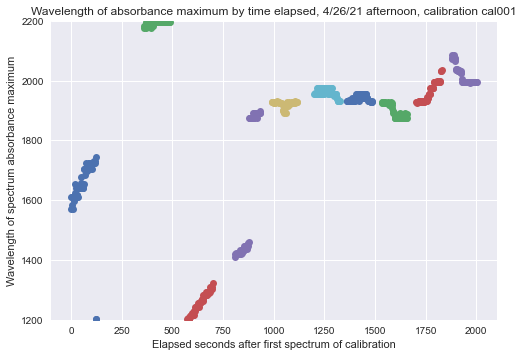

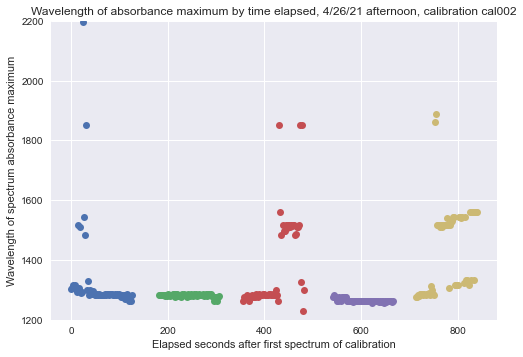

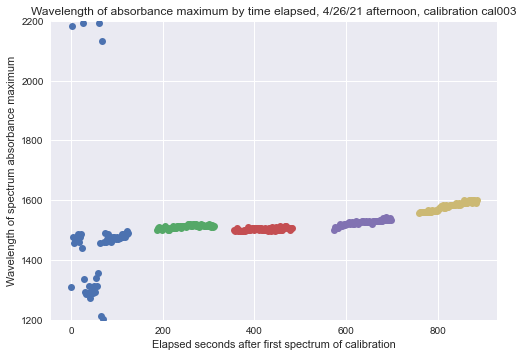

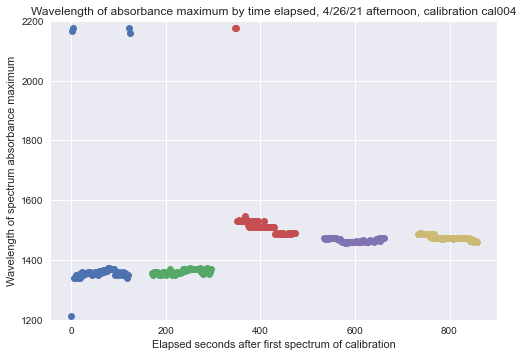

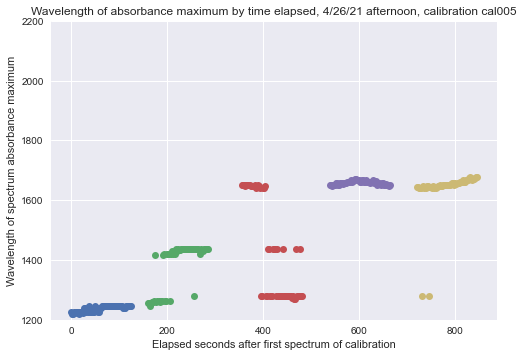

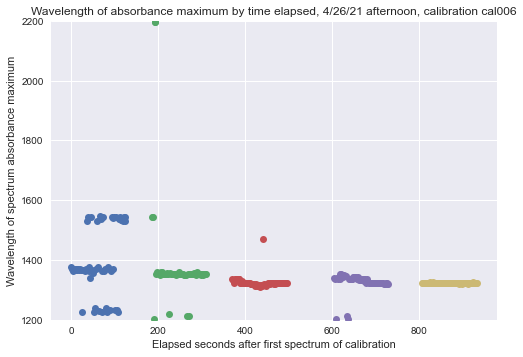

In [28]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
for calibration in afternoon_df['calibration'].unique():
    fig, ax = plt.subplots()
    small_df = afternoon_df.loc[afternoon_df['calibration'] == calibration].copy()
    file = construct_full_file_path(path_name, small_df['file_name'][small_df.index[0]])
    calibration_path = small_df['session'][small_df.index[0]] + '/' + small_df['calibration'][small_df.index[0]]
    calibration_insertions = create_list_of_insertions_in_calibration(file, calibration_path)
    
    first_timestamp = get_ftir_spectrum_timestamp(file, calibration_insertions[0], 0)
    for index in small_df.index:  
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        ftir_waves = get_ftir_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(ftir_waves, 1200)
        end_index = find_position_in_wavelength_vector(ftir_waves, 2200)
        ftir_raw_spectra = get_ftir_insertion_raw_spectra(file, insertion_path)
        ftir_white_spectrum = get_ftir_white_calibration_curve(file, calibration_path)[start_index:end_index]
        ftir_dark_spectrum = get_ftir_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        
        
        insertion_df = pd.DataFrame()
        for i in range(ftir_raw_spectra.shape[0]):
            absorbance_spectrum = calculate_absorbance_from_raw(ftir_raw_spectra[i, start_index:end_index], ftir_white_spectrum, ftir_dark_spectrum)
            max_absorbance = abs(absorbance_spectrum).max()
            try:
                max_absorbance_position = np.where(np.isclose(abs(absorbance_spectrum), max_absorbance))[0][0]
            except:
                max_absorbance_position = np.where(np.isclose(absorbance_spectrum, -max_absorbance))[0][0]
            wavelength_max = ftir_waves[start_index:end_index][max_absorbance_position]
            spectrum_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            insertion_df.loc[i, "wavelength_max"] = wavelength_max
            
        ax.plot(insertion_df["time_delta"], insertion_df["wavelength_max"], 'o')
    ax.set_title(f'Wavelength of absorbance maximum by time elapsed, 4/26/21 afternoon, calibration {calibration}')
    ax.set_ylabel('Wavelength of spectrum absorbance maximum')
    ax.set_xlabel('Elapsed seconds after first spectrum of calibration')

    ax.set_ylim(1200, 2200)
    plt.show()
    plt.close()

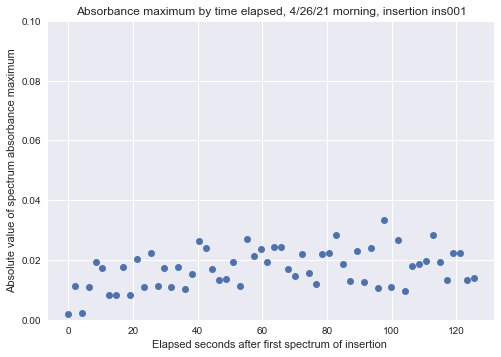

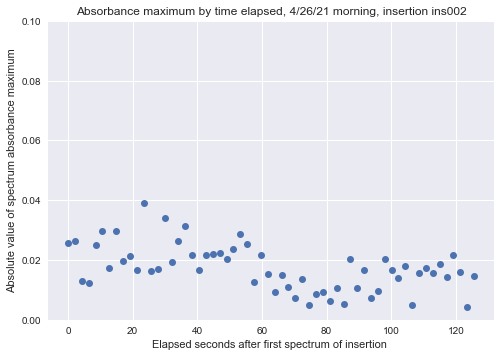

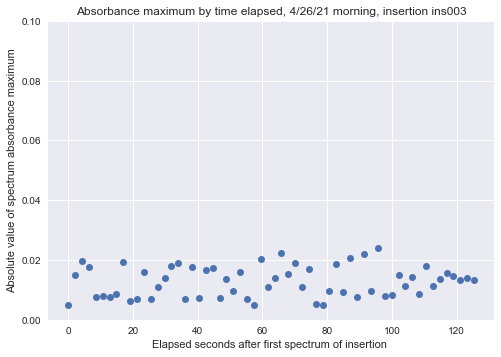

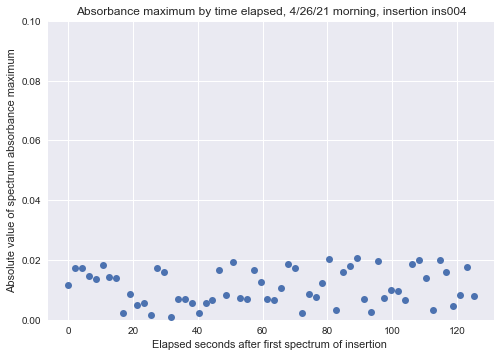

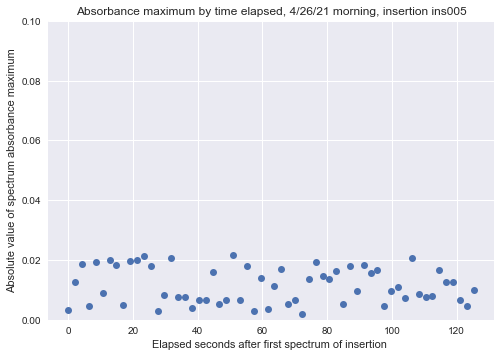

...

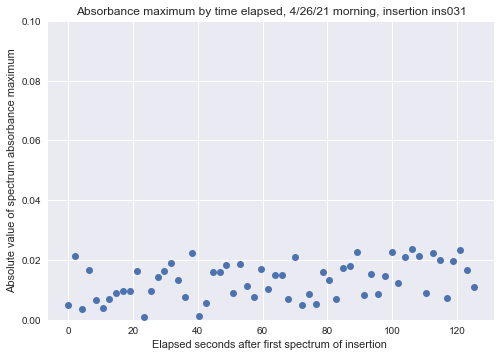

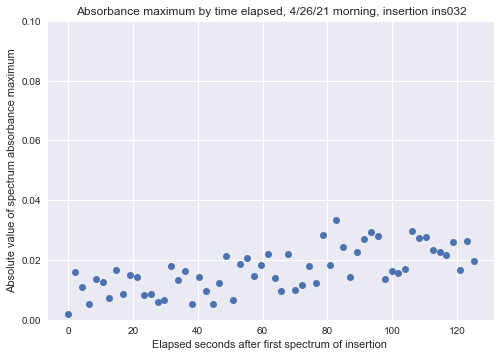

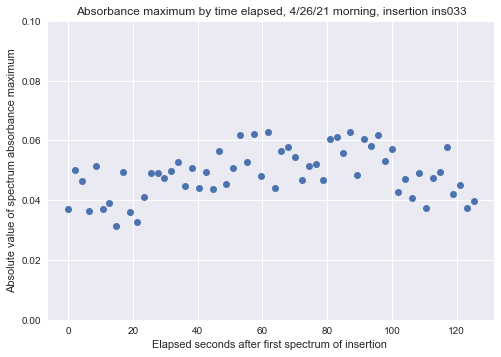

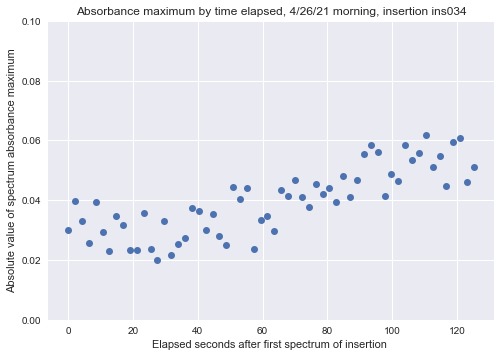

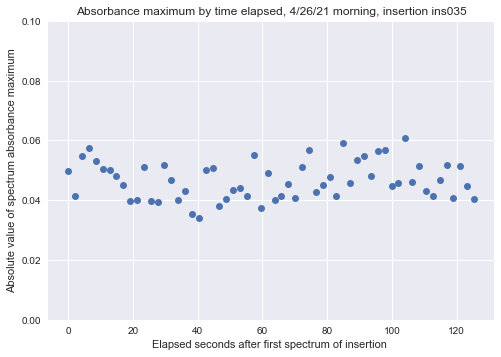

In [29]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
for calibration in afternoon_df['calibration'].unique():
    small_df = afternoon_df.loc[afternoon_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 500)
        end_index = find_position_in_wavelength_vector(vis_waves, 1000)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_visible_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            absorbance_spectrum = savgol_filter(calculate_absorbance_from_raw(vis_raw_spectra[i, start_index:end_index], vis_white_spectrum, vis_dark_spectrum), 21, 3)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            
        ax.plot(insertion_df["time_delta"], insertion_df["max_absorbance"], 'o')
        ax.set_title(f'Absorbance maximum by time elapsed, 4/26/21 morning, insertion {insertion}')
        ax.set_ylabel('Absolute value of spectrum absorbance maximum')
        ax.set_xlabel('Elapsed seconds after first spectrum of insertion ')
        ax.set_ylim(0, 0.1)
        plt.show()
        plt.close()

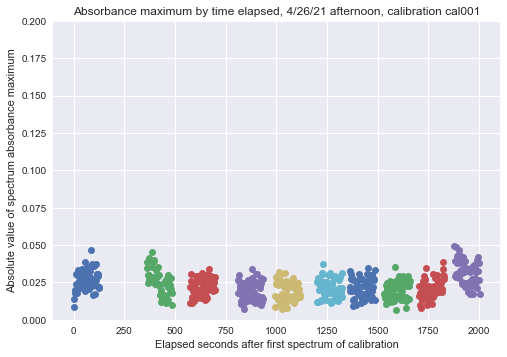

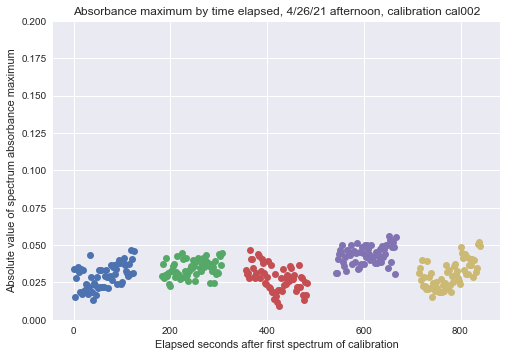

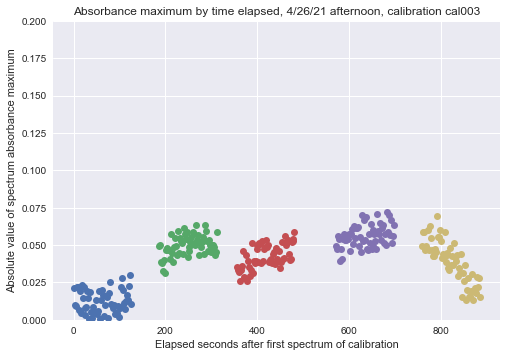

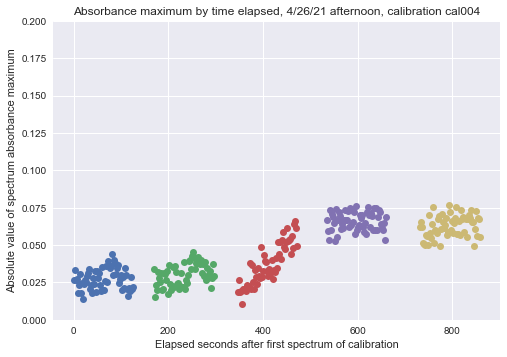

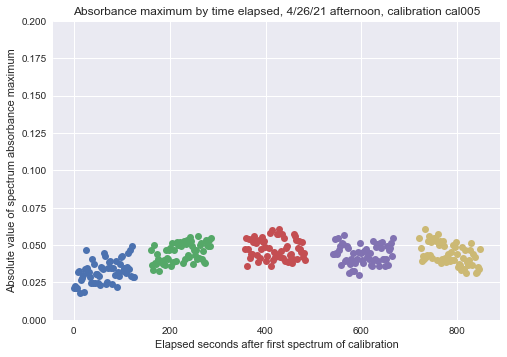

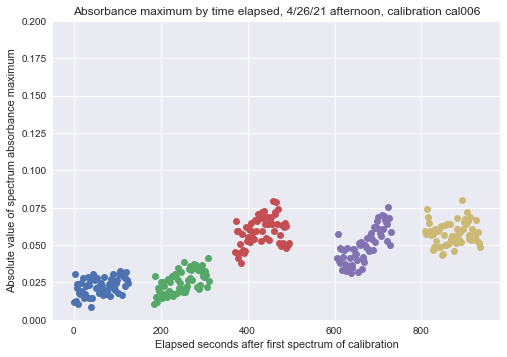

In [32]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
for calibration in afternoon_df['calibration'].unique():
    fig, ax = plt.subplots()
    small_df = afternoon_df.loc[afternoon_df['calibration'] == calibration].copy()
    file = construct_full_file_path(path_name, small_df['file_name'][small_df.index[0]])
    calibration_path = small_df['session'][small_df.index[0]] + '/' + small_df['calibration'][small_df.index[0]]
    calibration_insertions = create_list_of_insertions_in_calibration(file, calibration_path)
    
    first_timestamp = get_visible_spectrum_timestamp(file, calibration_insertions[0], 0)
    for index in small_df.index:  
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 500)
        end_index = find_position_in_wavelength_vector(vis_waves, 1000)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        
        
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            absorbance_spectrum = calculate_absorbance_from_raw(vis_raw_spectra[i, start_index:end_index], vis_white_spectrum, vis_dark_spectrum)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            
        ax.plot(insertion_df["time_delta"], insertion_df["max_absorbance"], 'o')
    ax.set_title(f'Absorbance maximum by time elapsed, 4/26/21 afternoon, calibration {calibration}')
    ax.set_ylabel('Absolute value of spectrum absorbance maximum')
    ax.set_xlabel('Elapsed seconds after first spectrum of calibration')

    ax.set_ylim(0, 0.2)
    plt.show()
    plt.close()

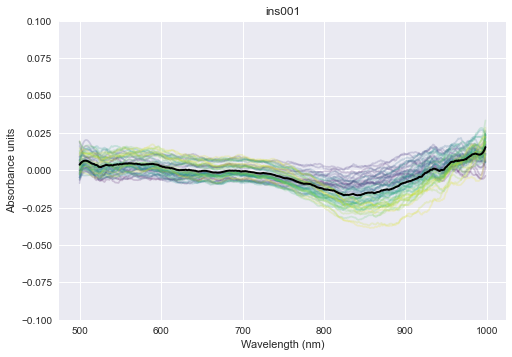

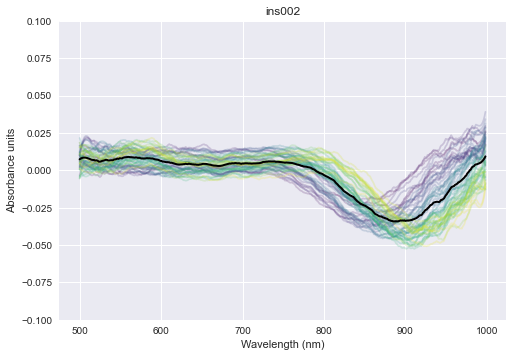

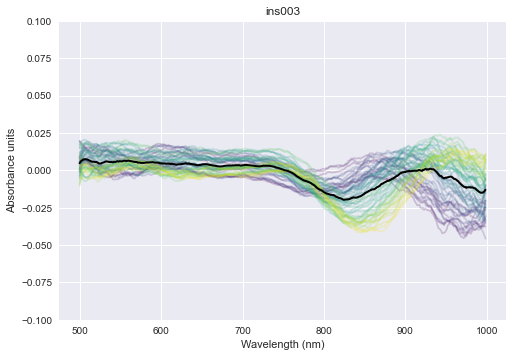

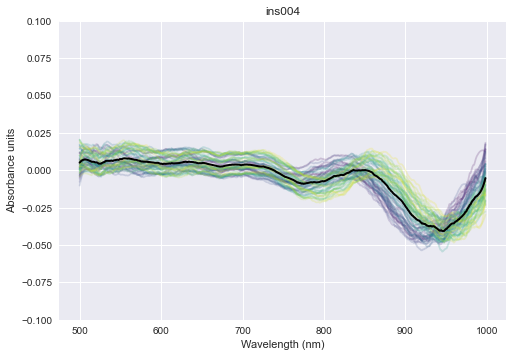

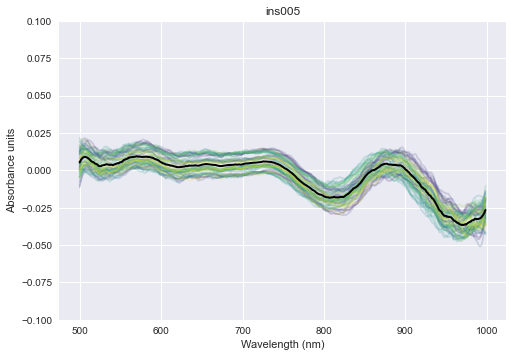

...

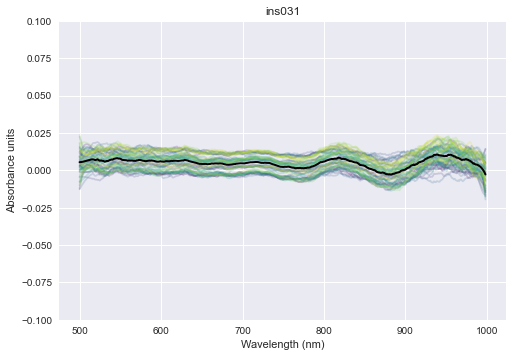

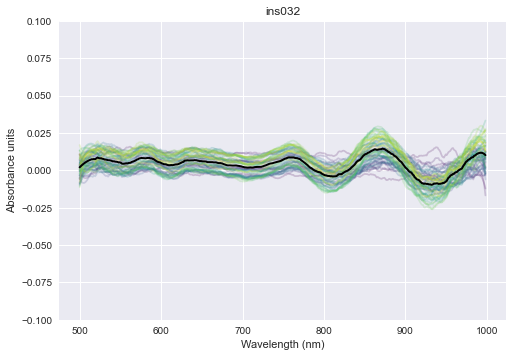

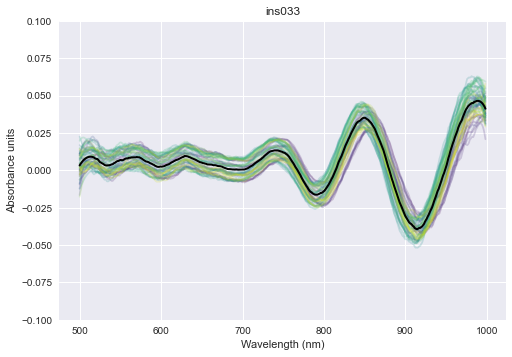

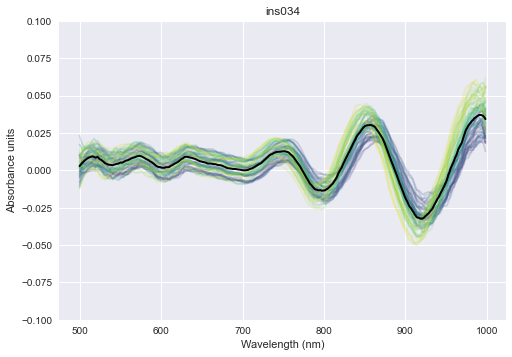

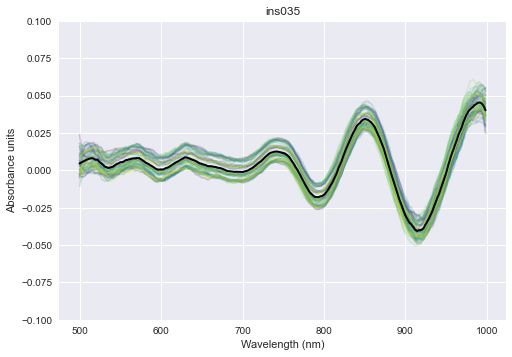

In [33]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
for calibration in afternoon_df['calibration'].unique():
    small_df = afternoon_df.loc[afternoon_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 500)
        end_index = find_position_in_wavelength_vector(vis_waves, 1000)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        absorbance_spectra = np.empty_like(vis_raw_spectra[:, start_index:end_index], dtype=np.double)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_visible_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            absorbance_spectrum = savgol_filter(calculate_absorbance_from_raw(vis_raw_spectra[i, start_index:end_index], vis_white_spectrum, vis_dark_spectrum), 21, 3)
            max_absorbance = abs(absorbance_spectrum.max())
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            absorbance_spectra[i, :] = absorbance_spectrum
            color = plt.cm.viridis(normalize(i, vis_raw_spectra.shape[0], 0))
            
            ax.plot(vis_waves[start_index:end_index], absorbance_spectrum, color=color, alpha=0.2)
        ax.plot(vis_waves[start_index:end_index], absorbance_spectra.mean(axis=0), 'k', lw=2)
        ax.set_title(insertion)
        ax.set_ylabel("Absorbance units")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_ylim(-0.1, 0.1)
        plt.show()
        plt.close()

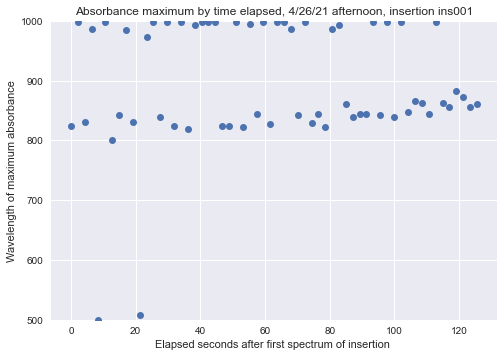

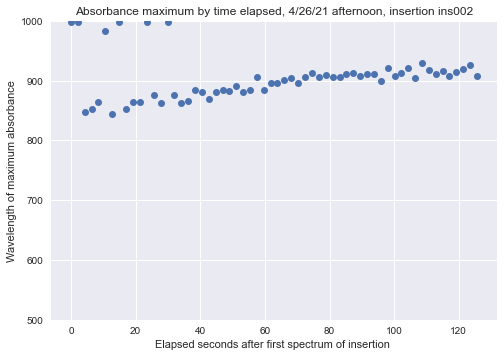

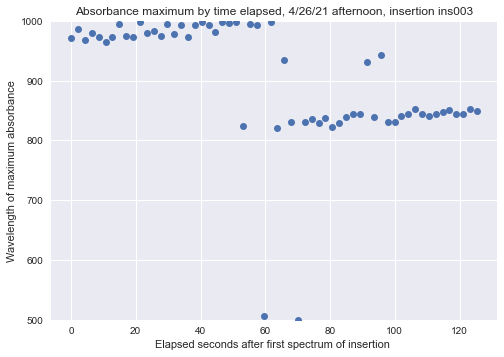

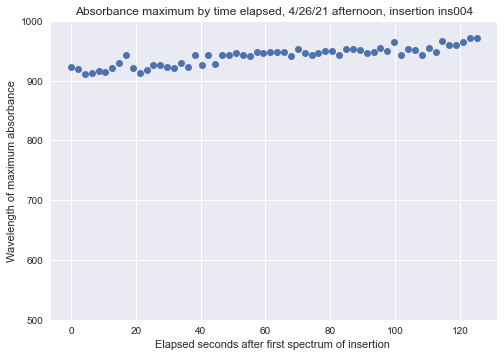

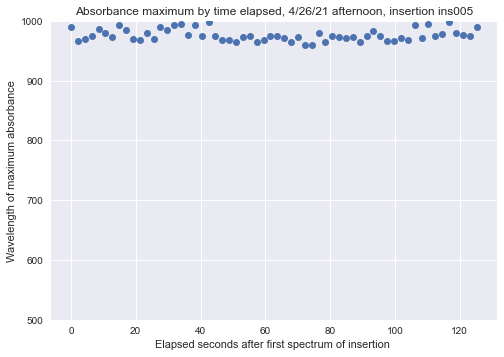

...

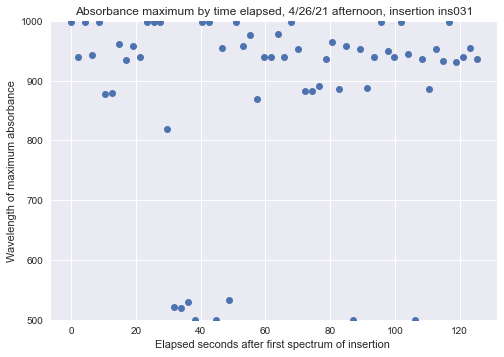

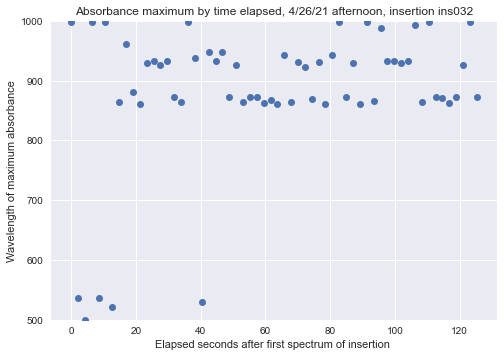

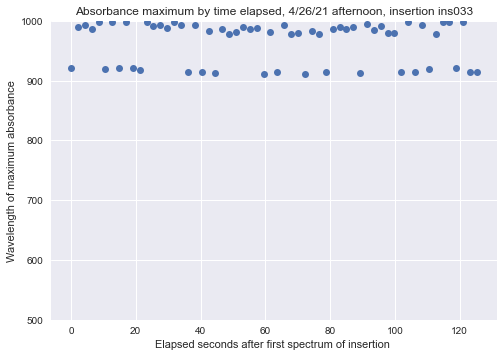

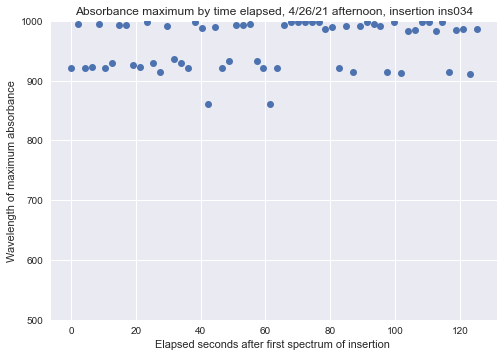

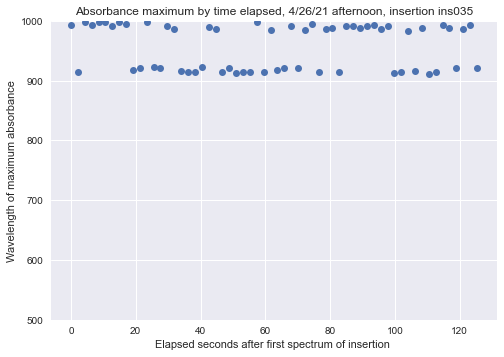

In [37]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
for calibration in afternoon_df['calibration'].unique():
    small_df = afternoon_df.loc[afternoon_df['calibration'] == calibration].copy()
    for index in small_df.index:    
        file = construct_full_file_path(path_name, small_df['file_name'][index])
        calibration_path = small_df['session'][index] + '/' + small_df['calibration'][index]
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 500)
        end_index = find_position_in_wavelength_vector(vis_waves, 1000)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        fig, ax = plt.subplots()
        first_timestamp = get_visible_spectrum_timestamp(file, insertion_path, 0)
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            absorbance_spectrum = savgol_filter(calculate_absorbance_from_raw(vis_raw_spectra[i, start_index:end_index], vis_white_spectrum, vis_dark_spectrum), 21, 3)
            max_absorbance = abs(absorbance_spectrum).max()
            try:
                max_absorbance_position = np.where(np.isclose(absorbance_spectrum, max_absorbance))[0][0]
            except:
                max_absorbance_position = np.where(np.isclose(absorbance_spectrum, -max_absorbance))[0][0]
            wavelength_max = vis_waves[start_index:end_index][max_absorbance_position]            
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            insertion_df.loc[i, "wavelength_max"] = wavelength_max
            
        ax.plot(insertion_df["time_delta"], insertion_df["wavelength_max"], 'o')
        ax.set_title(f'Absorbance maximum by time elapsed, 4/26/21 afternoon, insertion {insertion}')
        ax.set_ylabel('Wavelength of maximum absorbance')
        ax.set_xlabel('Elapsed seconds after first spectrum of insertion ')
        ax.set_ylim(500, 1000)
        plt.show()
        plt.close()

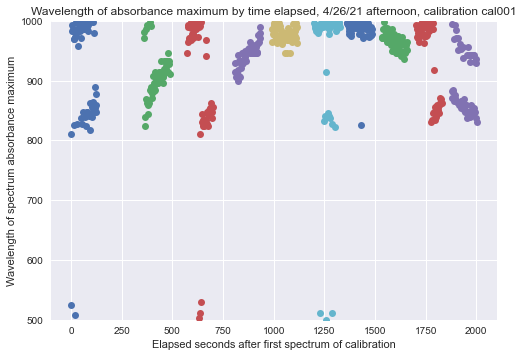

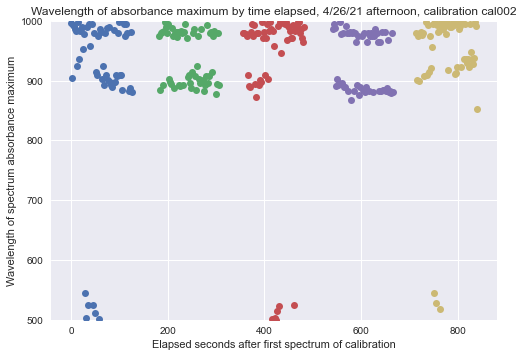

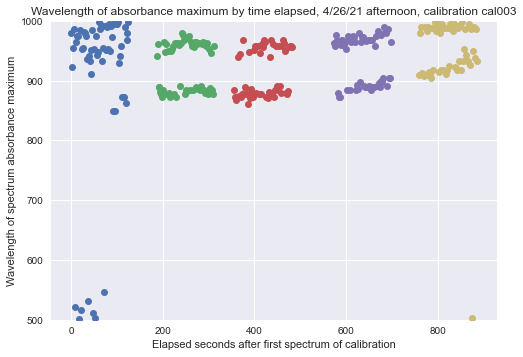

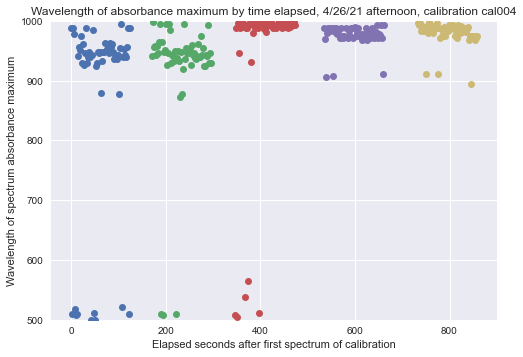

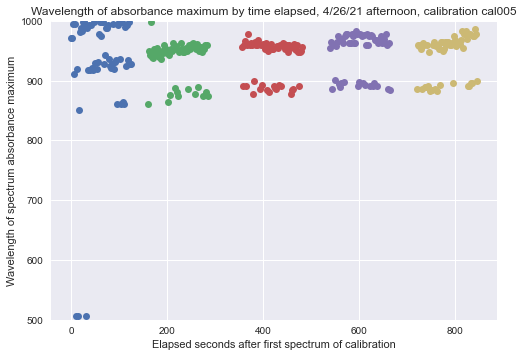

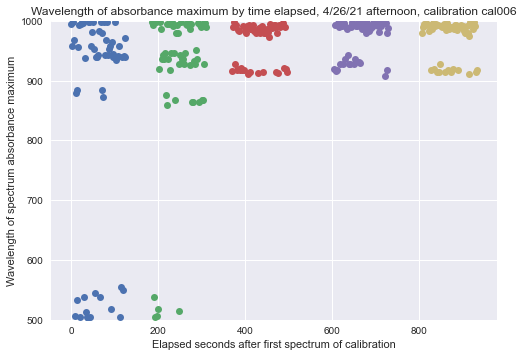

In [36]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
for calibration in afternoon_df['calibration'].unique():
    fig, ax = plt.subplots()
    small_df = afternoon_df.loc[afternoon_df['calibration'] == calibration].copy()
    file = construct_full_file_path(path_name, small_df['file_name'][small_df.index[0]])
    calibration_path = small_df['session'][small_df.index[0]] + '/' + small_df['calibration'][small_df.index[0]]
    calibration_insertions = create_list_of_insertions_in_calibration(file, calibration_path)
    
    first_timestamp = get_visible_spectrum_timestamp(file, calibration_insertions[0], 0)
    for index in small_df.index:  
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 500)
        end_index = find_position_in_wavelength_vector(vis_waves, 1000)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        
        
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            absorbance_spectrum = calculate_absorbance_from_raw(vis_raw_spectra[i, start_index:end_index], vis_white_spectrum, vis_dark_spectrum)
            max_absorbance = abs(absorbance_spectrum).max()
            try:
                max_absorbance_position = np.where(np.isclose(abs(absorbance_spectrum), max_absorbance))[0][0]
            except:
                max_absorbance_position = np.where(np.isclose(absorbance_spectrum, -max_absorbance))[0][0]
            wavelength_max = vis_waves[start_index:end_index][max_absorbance_position]
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            insertion_df.loc[i, "wavelength_max"] = wavelength_max
            
        ax.plot(insertion_df["time_delta"], insertion_df["wavelength_max"], 'o')
    ax.set_title(f'Wavelength of absorbance maximum by time elapsed, 4/26/21 afternoon, calibration {calibration}')
    ax.set_ylabel('Wavelength of spectrum absorbance maximum')
    ax.set_xlabel('Elapsed seconds after first spectrum of calibration')

    ax.set_ylim(500, 1000)
    plt.show()
    plt.close()

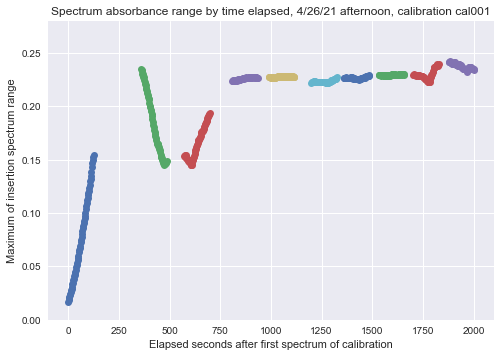

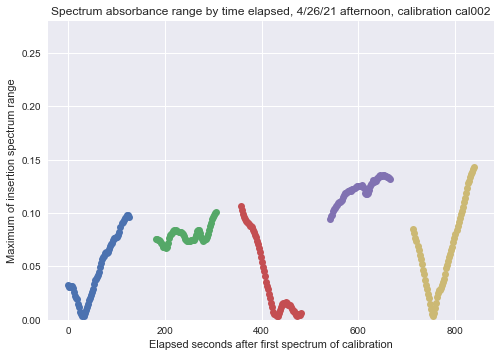

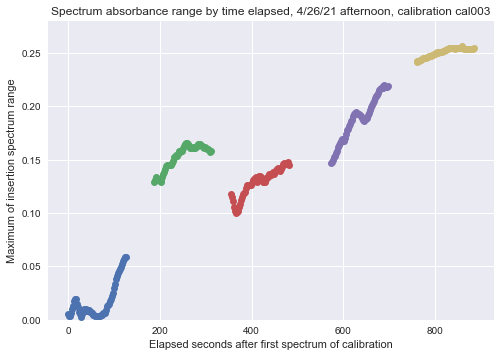

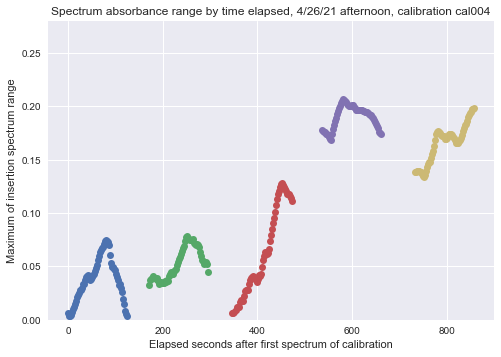

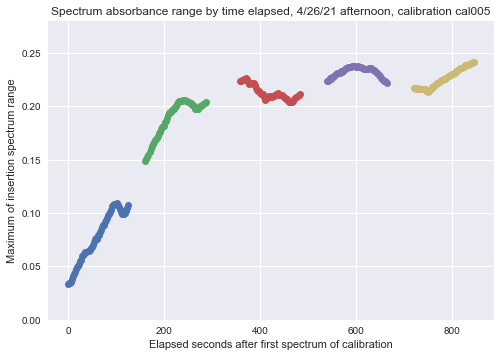

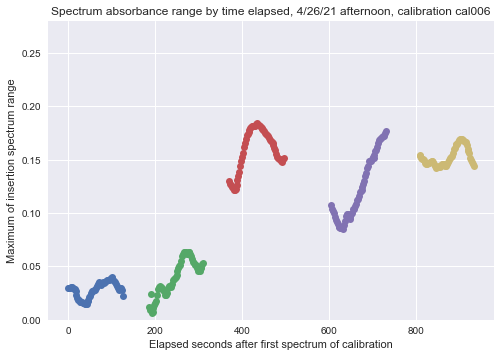

In [68]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
for calibration in afternoon_df['calibration'].unique():
    fig, ax = plt.subplots()
    small_df = afternoon_df.loc[afternoon_df['calibration'] == calibration].copy()
    file = construct_full_file_path(path_name, small_df['file_name'][small_df.index[0]])
    calibration_path = small_df['session'][small_df.index[0]] + '/' + small_df['calibration'][small_df.index[0]]
    calibration_insertions = create_list_of_insertions_in_calibration(file, calibration_path)
    
    first_timestamp = get_ftir_spectrum_timestamp(file, calibration_insertions[0], 0)
    for index in small_df.index:  
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        ftir_waves = get_ftir_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(ftir_waves, 1200)
        end_index = find_position_in_wavelength_vector(ftir_waves, 2200)
        ftir_raw_spectra = get_ftir_insertion_raw_spectra(file, insertion_path)
        ftir_white_spectrum = get_ftir_white_calibration_curve(file, calibration_path)[start_index:end_index]
        ftir_dark_spectrum = get_ftir_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        ftir_absorbance_spectra = calculate_absorbance_for_2D_array(ftir_raw_spectra[:, start_index:end_index], ftir_white_spectrum, ftir_dark_spectrum)

        insertion_df = pd.DataFrame()
        for i in range(ftir_raw_spectra.shape[0]):
            range_absorbance = np.ptp(ftir_absorbance_spectra[i, :])
            spectrum_timestamp = get_ftir_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "max_absorbance"] = max_absorbance
            insertion_df.loc[i, "range_absorbance"] = range_absorbance
            
            
        ax.plot(insertion_df["time_delta"], insertion_df["range_absorbance"], 'o')
    ax.set_title(f'Spectrum absorbance range by time elapsed, 4/26/21 afternoon, calibration {calibration}')
    ax.set_ylabel('Maximum of insertion spectrum range')
    ax.set_xlabel('Elapsed seconds after first spectrum of calibration')

    ax.set_ylim(0, 0.28)
    plt.show()
    plt.close()

    

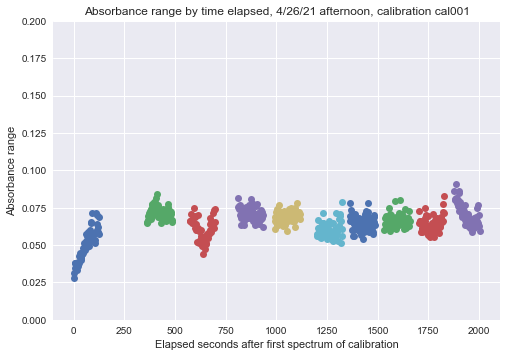

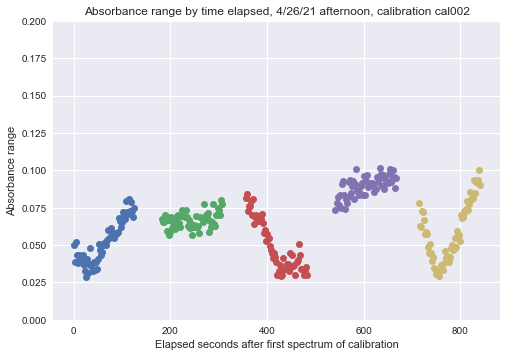

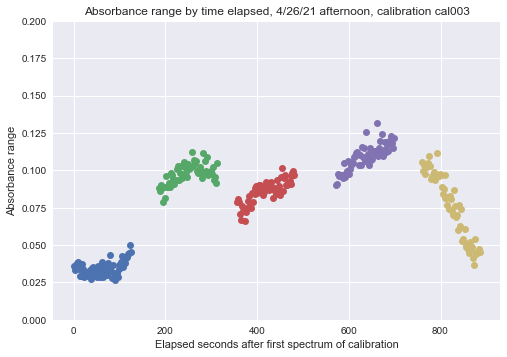

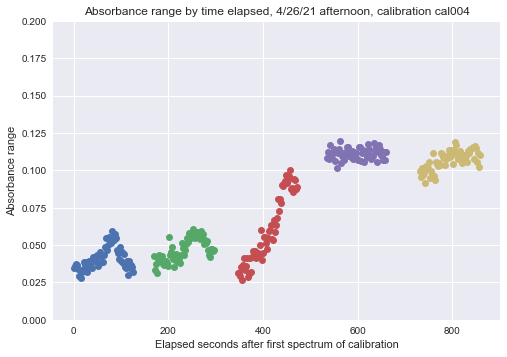

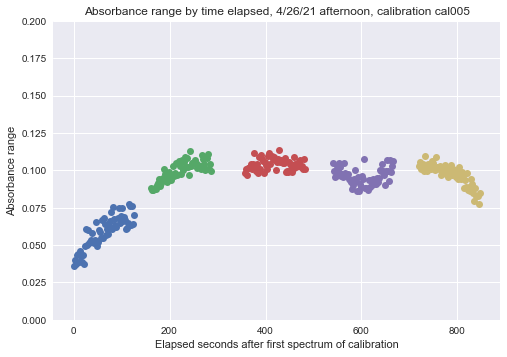

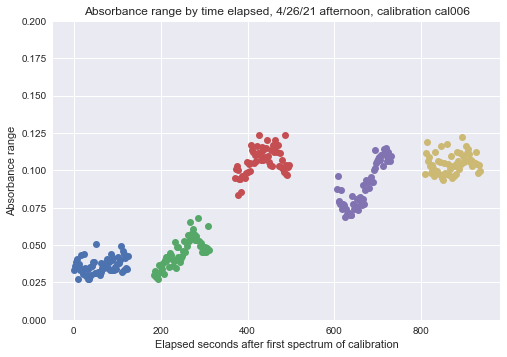

In [69]:
path_name = "/Users/linda/OneDrive/Documents/S4_mine_p/Projects/Data_collected/"
for calibration in afternoon_df['calibration'].unique():
    fig, ax = plt.subplots()
    small_df = afternoon_df.loc[afternoon_df['calibration'] == calibration].copy()
    file = construct_full_file_path(path_name, small_df['file_name'][small_df.index[0]])
    calibration_path = small_df['session'][small_df.index[0]] + '/' + small_df['calibration'][small_df.index[0]]
    calibration_insertions = create_list_of_insertions_in_calibration(file, calibration_path)
    
    first_timestamp = get_visible_spectrum_timestamp(file, calibration_insertions[0], 0)
    for index in small_df.index:  
        insertion_path = calibration_path + '/' + small_df['insertion'][index]
        insertion = small_df['insertion'][index]
        insertion_start = get_insertion_timestamp(file, insertion_path)
        vis_waves = get_visible_wavelength_vector(file, calibration_path)
        start_index = find_position_in_wavelength_vector(vis_waves, 500)
        end_index = find_position_in_wavelength_vector(vis_waves, 1000)
        vis_raw_spectra = get_visible_insertion_raw_spectra(file, insertion_path)
        vis_white_spectrum = get_visible_white_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_dark_spectrum = get_visible_dark_calibration_curve(file, calibration_path)[start_index:end_index]
        vis_absorbance_spectra = calculate_absorbance_for_2D_array(vis_raw_spectra[:, start_index:end_index], vis_white_spectrum, vis_dark_spectrum)
        
        insertion_df = pd.DataFrame()
        for i in range(vis_raw_spectra.shape[0]):
            range_absorbance = np.ptp(vis_absorbance_spectra[i, :])
            spectrum_timestamp = get_visible_spectrum_timestamp(file, insertion_path, i)
            time_delta = spectrum_timestamp - first_timestamp
            insertion_df.loc[i, "time_delta"] = time_delta.total_seconds()
            insertion_df.loc[i, "range_absorbance"] = range_absorbance
            
        ax.plot(insertion_df["time_delta"], insertion_df["range_absorbance"], 'o')
    ax.set_title(f'Absorbance range by time elapsed, 4/26/21 afternoon, calibration {calibration}')
    ax.set_ylabel('Absorbance range')
    ax.set_xlabel('Elapsed seconds after first spectrum of calibration')

    ax.set_ylim(0, 0.2)
    plt.show()
    plt.close()